In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from torch_geometric.data import Data
from torch_geometric.nn import GAE, GCNConv
import pandas as pd
import torch
import torch.nn as nn
import torch_geometric
import numpy as np

# Load dataset
df = pd.read_csv("./final_df.csv")

# Step 1: Define feature columns
sociodemographic_columns = [
    "Total_Population", "Uninsured_Rate",
    "Rent_as_Income_Percentage", "Limited_English_Proficiency_Rate",
    "No_Vehicle_Rate", "No_Internet_Rate"
]

health_columns = [col for col in df.columns if "_CrudePrev" in col]
distance_columns = [col for col in df.columns if col.startswith("haversine_dist_to_")]
feature_cols = sociodemographic_columns + health_columns + distance_columns

# Step 2: Normalize features
scaler = StandardScaler()
x_scaled = scaler.fit_transform(df[feature_cols].fillna(0))
x = torch.tensor(x_scaled, dtype=torch.float)

# Step 3: Build edge index using KNN
coords = df[['lat', 'lon']].values
knn = NearestNeighbors(n_neighbors=5)
knn.fit(coords)
edges = knn.kneighbors_graph(coords, mode='connectivity').tocoo()
edge_index = torch.tensor([edges.row, edges.col], dtype=torch.long)

# Step 4: Create graph data
data = Data(x=x, edge_index=edge_index)

# Step 5: Define GCN Encoder
class ImprovedGCNEncoder(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.5):
        super(ImprovedGCNEncoder, self).__init__()
        self.conv1 = GCNConv(in_channels, 128)
        self.bn1 = nn.BatchNorm1d(128)

        self.conv2 = GCNConv(128, 128)
        self.bn2 = nn.BatchNorm1d(128)

        self.conv3 = GCNConv(128, 64)
        self.bn3 = nn.BatchNorm1d(64)

        self.conv4 = GCNConv(64, 64)
        self.bn4 = nn.BatchNorm1d(64)

        self.conv5 = GCNConv(64, out_channels)  # Output layer

        self.dropout = dropout

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = torch.relu(self.bn1(x))
        x = torch.dropout(x, p=self.dropout, train=self.training)

        x = self.conv2(x, edge_index)
        x = torch.relu(self.bn2(x))
        x = torch.dropout(x, p=self.dropout, train=self.training)

        x = self.conv3(x, edge_index)
        x = torch.relu(self.bn3(x))
        x = torch.dropout(x, p=self.dropout, train=self.training)

        x = self.conv4(x, edge_index)
        x = torch.relu(self.bn4(x))
        x = torch.dropout(x, p=self.dropout, train=self.training)

        return self.conv5(x, edge_index)  # Final output (no BN or ReLU)


# Step 6: Train GAE
# Change from GCNEncoder to ImprovedGCNEncoder
model = GAE(ImprovedGCNEncoder(x.shape[1], 32))  # 32 = embedding size
optimizer = torch.optim.AdamW(model.parameters(), lr=0.01, weight_decay=5e-4)  # L2 regularization with weight_decay
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = np.inf
        self.counter = 0

    def should_stop(self, loss):
        if loss < self.best_loss - self.min_delta:
            self.best_loss = loss
            self.counter = 0
            return False
        elif self.counter >= self.patience:
            return True
        else:
            self.counter += 1
            return False
# Instantiate early stopping
early_stopping = EarlyStopping(patience=10, min_delta=0.01)

model.train()
for epoch in range(200):
    optimizer.zero_grad()
    z = model.encode(x, edge_index)
    loss = model.recon_loss(z, edge_index)
    
    loss.backward()
    optimizer.step()
    
    # Check for early stopping
    if early_stopping.should_stop(loss.item()):
        print(f"Early stopping at epoch {epoch}")
        break

    if epoch % 20 == 0:
        print(f"Epoch {epoch} — Loss: {loss.item():.4f}")




/tmp/ipykernel_10747/1275641902.py:35: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /opt/conda/conda-bld/pytorch_1729647352509/work/torch/csrc/utils/tensor_new.cpp:278.)
  edge_index = torch.tensor([edges.row, edges.col], dtype=torch.long)


In [ ]:
import pathlib
# Step 7: Save embeddings and graph data
SAVE_DIR = pathlib.Path("./embedding_graph_more_layers_no_income_data")
SAVE_DIR.mkdir(exist_ok=True)

# Save node embeddings
torch.save(z.detach().cpu(), SAVE_DIR / "gae_embeddings.pt")
print("[✓] Embeddings saved → embedding_graph/gae_embeddings.pt")

# Save the graph data object
torch.save(data, SAVE_DIR / "graph_data.pt")
print("[✓] Graph data saved → embedding_graph/graph_data.pt")

/opt/conda/envs/pytorch-gpu/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


[✓] Loaded GAE embeddings from embedding_graph/gae_embeddings.pt
Embeddings: (22668, 32)


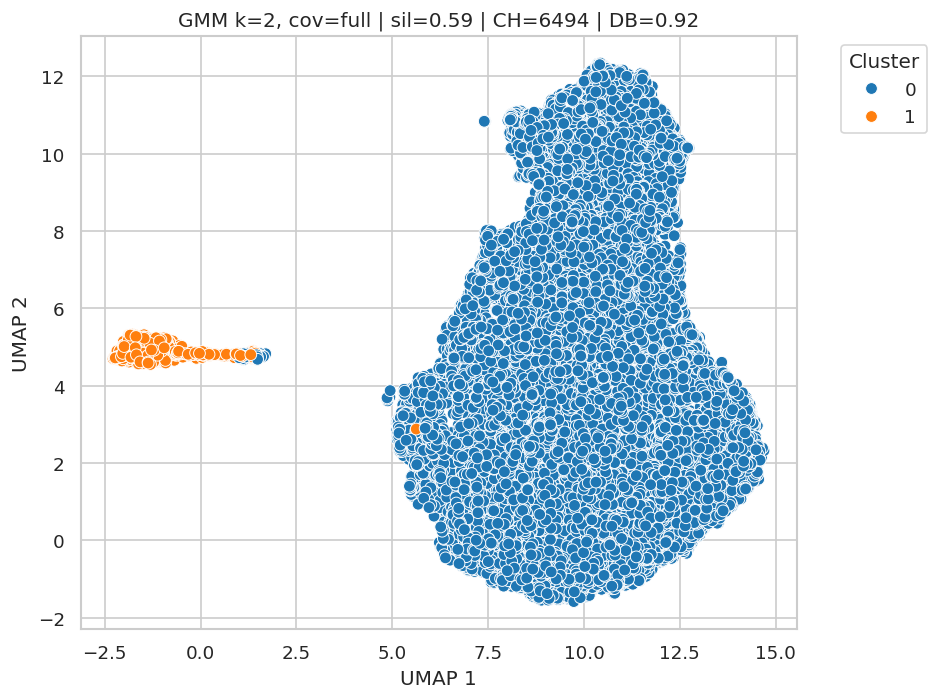

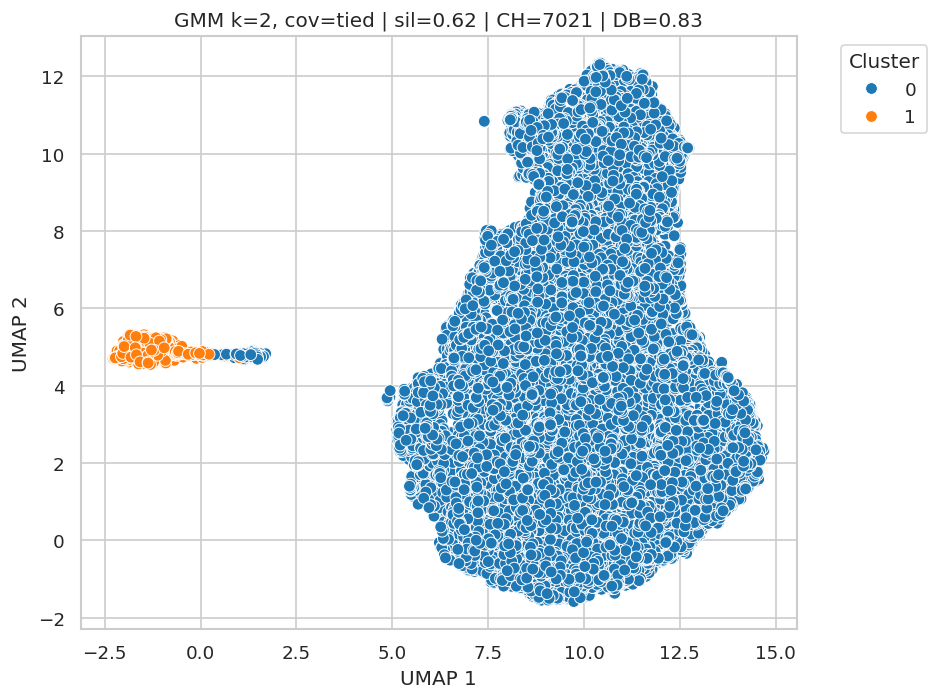

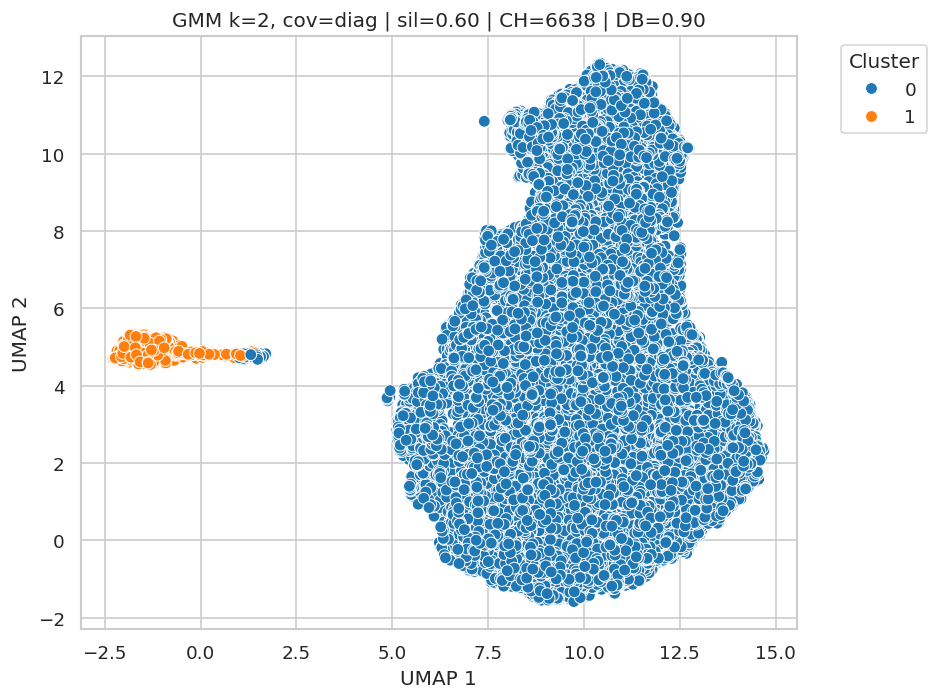

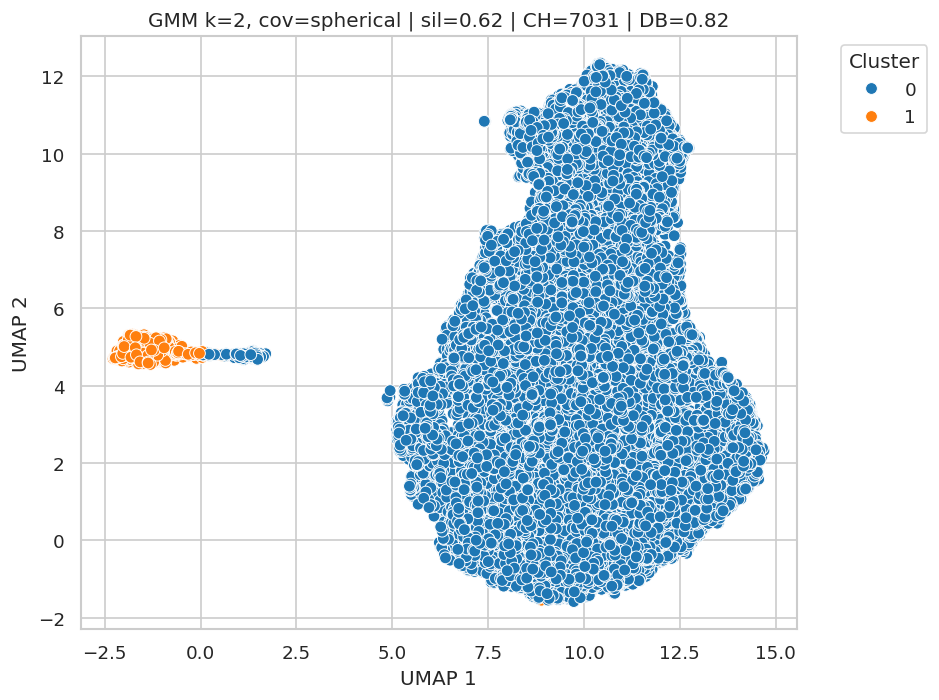

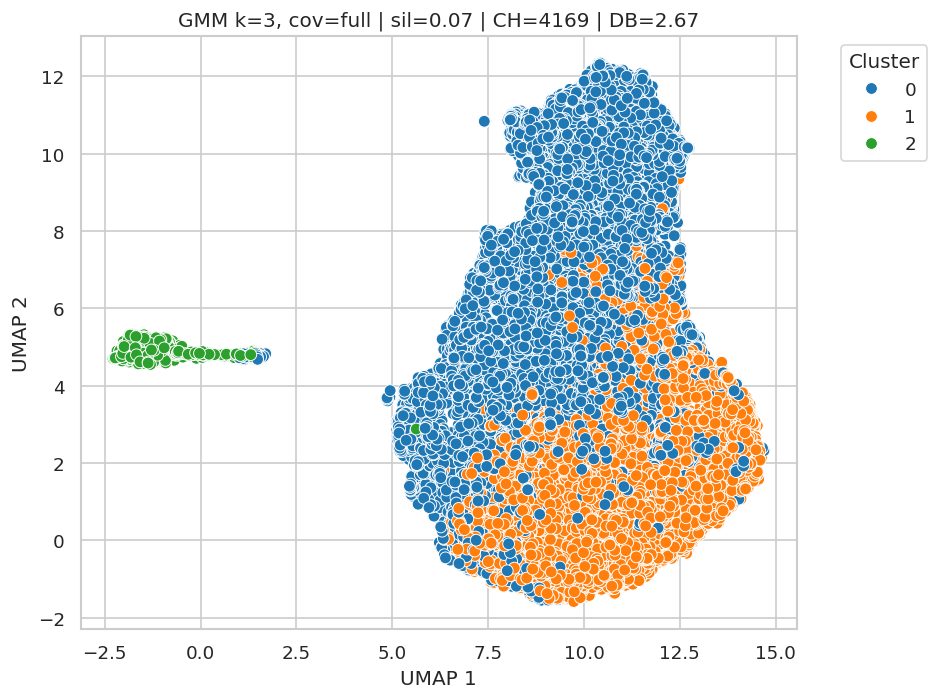

...

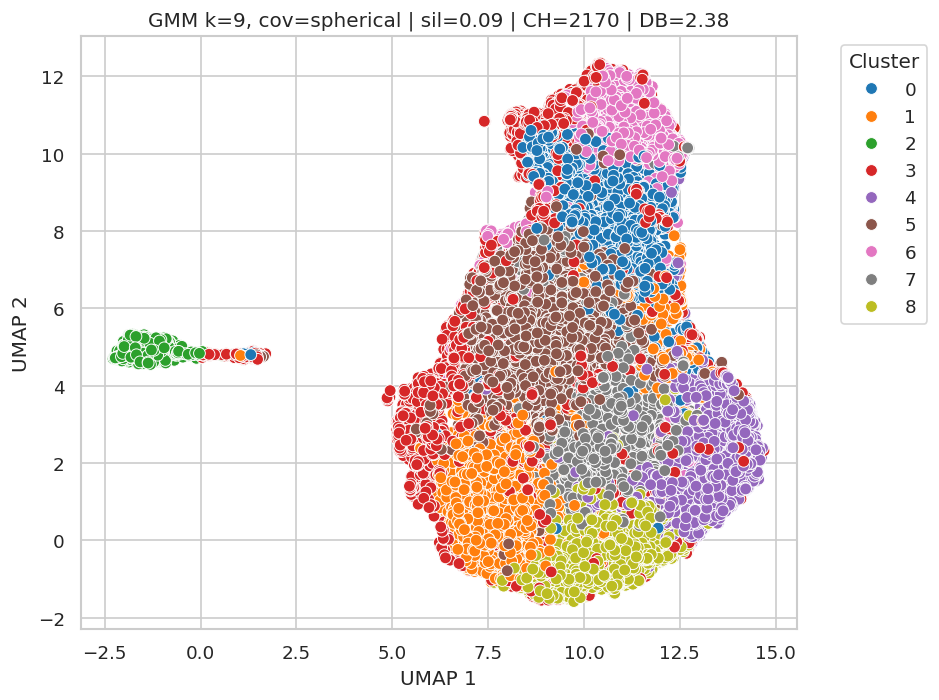

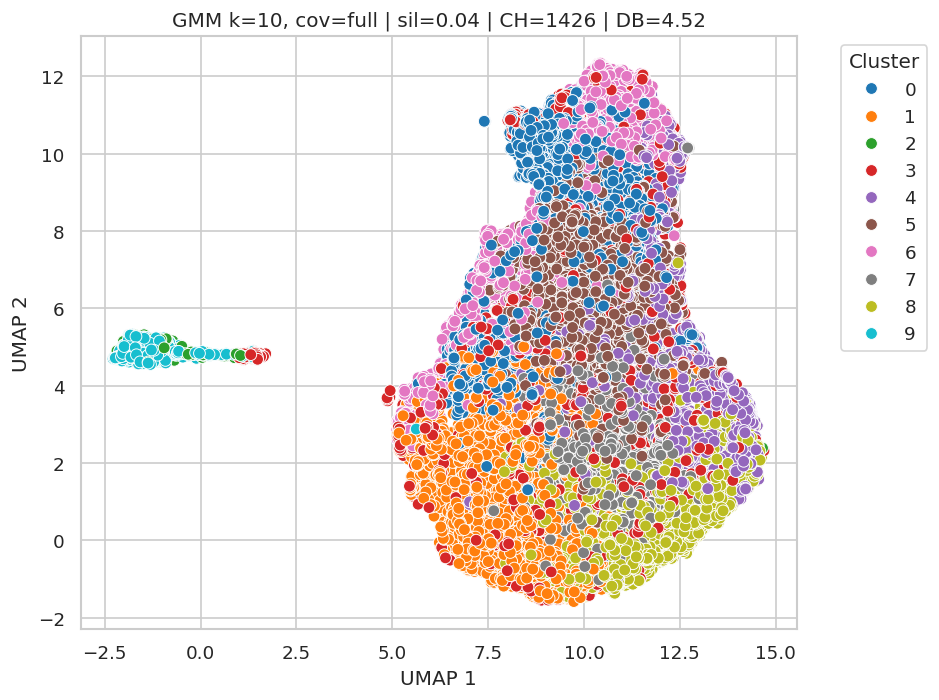

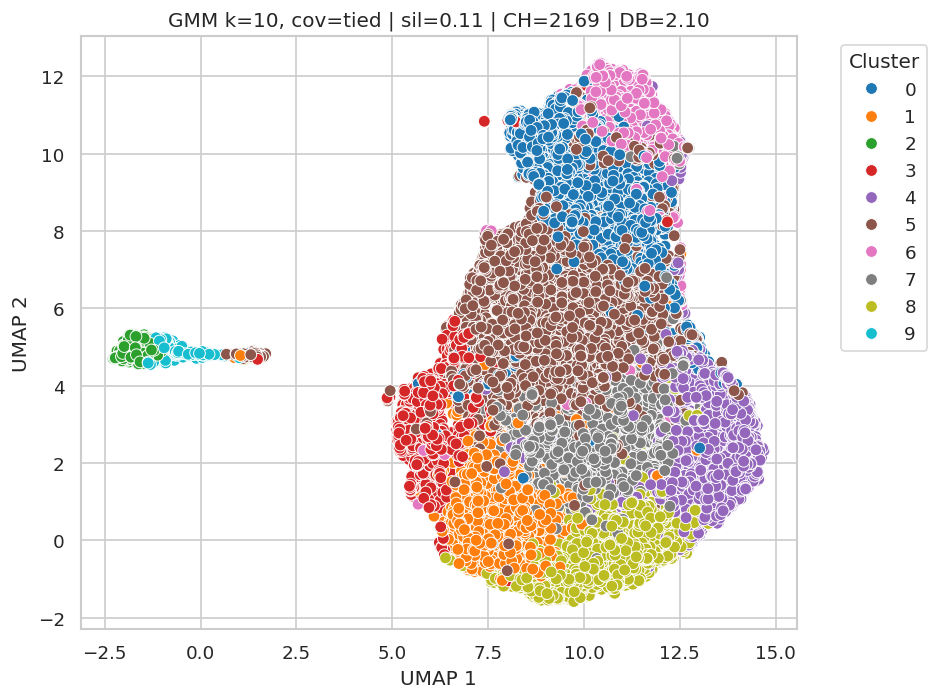

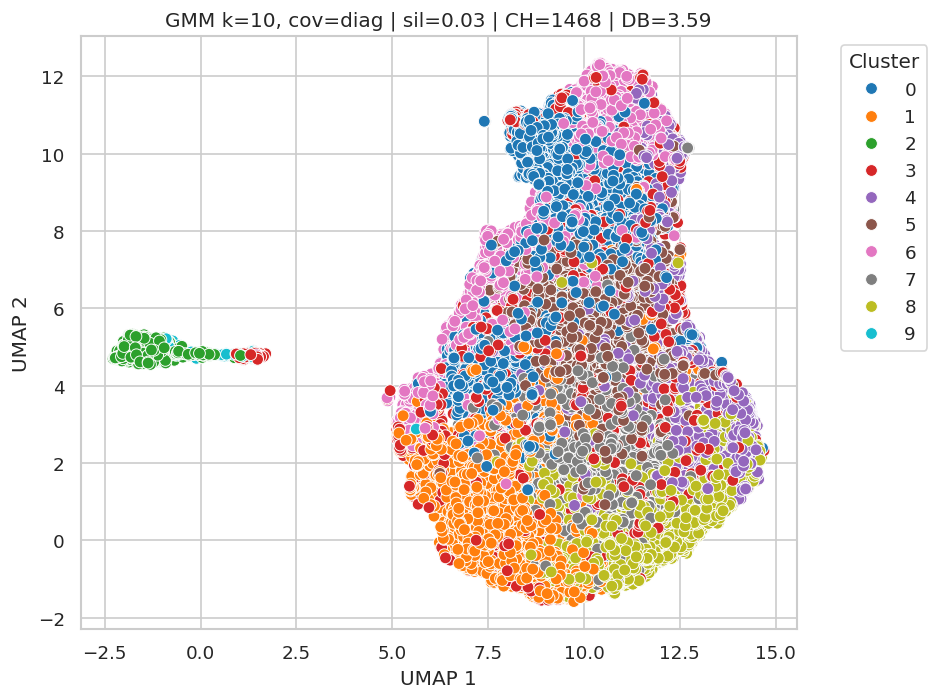

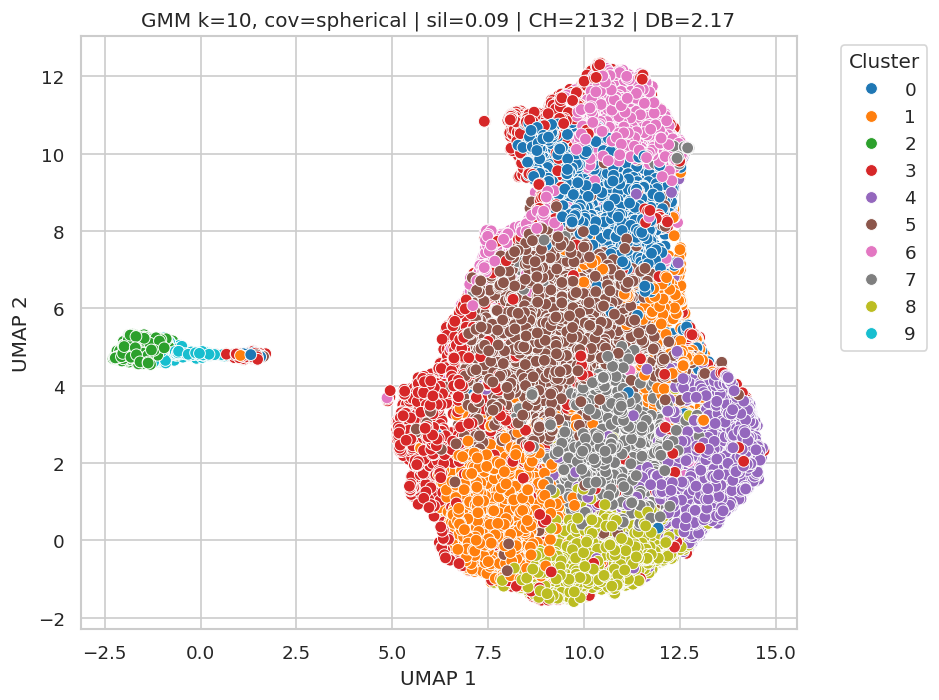


Saved GMM grid search metrics → gmm_gridsearch_metrics.csv


In [3]:
import warnings, pathlib, torch, numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
import umap
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from itertools import product

warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 120
sns.set(style="whitegrid")

DATA_DIR = pathlib.Path('./embedding_graph_more_layers_no_income_data')
OUT_DIR = pathlib.Path('./results_more_layers_no_incoe'); OUT_DIR.mkdir(exist_ok=True)

# ------------------ 1. Load GAE embeddings ------------------
Z = torch.load(DATA_DIR / "gae_embeddings.pt").numpy()
print('[✓] Loaded GAE embeddings from embedding_graph/gae_embeddings.pt')

# Apply log transformation to reduce skewness, then scale
Z_log = np.log1p(np.where(Z < 0, 0, Z))  # ensure non-negativity before log
X = StandardScaler().fit_transform(Z_log)

# Remove rows with NaN (just in case)
X = X[~np.isnan(X).any(axis=1)]
X2 = umap.UMAP(random_state=42).fit_transform(X)
print('Embeddings:', X.shape)

# ------------------ Clustering metrics function ------------------
def clustering_metrics(X, labels):
    if len(np.unique(labels)) < 2 or (-1 in labels and len(np.unique(labels)) == 2):
        return dict(sil=-1, ch=-1, db=np.inf)
    mask = labels != -1
    return dict(
        sil=silhouette_score(X[mask], labels[mask]),
        ch=calinski_harabasz_score(X[mask], labels[mask]),
        db=davies_bouldin_score(X[mask], labels[mask])
    )

# ------------------ GMM Grid Search ------------------
n_components_list = range(2, 11)
covariance_types = ['full', 'tied', 'diag', 'spherical']
gmm_records = []

for n_components, cov_type in product(n_components_list, covariance_types):
    try:
        gmm = GaussianMixture(n_components=n_components, covariance_type=cov_type, random_state=42)
        labels = gmm.fit_predict(X)
        met = clustering_metrics(X, labels)
        met.update({'n_components': n_components, 'covariance_type': cov_type})
        gmm_records.append(met)

        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=X2[:,0], y=X2[:,1], hue=labels, palette="tab10", s=50)
        plt.title(f'GMM k={n_components}, cov={cov_type} | sil={met["sil"]:.2f} | CH={met["ch"]:.0f} | DB={met["db"]:.2f}')
        plt.xlabel('UMAP 1'); plt.ylabel('UMAP 2')
        plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
        plt.tight_layout(); plt.show()
    except Exception as e:
        print(f"[!] GMM failed for k={n_components}, cov={cov_type}: {e}")

# Save GMM results
pd.DataFrame(gmm_records).to_csv(OUT_DIR/'gmm_gridsearch_metrics.csv', index=False)
print('\nSaved GMM grid search metrics → gmm_gridsearch_metrics.csv')

In [4]:
# 1. Load final_df
df = pd.read_csv("final_df.csv")

# 2. Recompute GAE embeddings preprocessing
Z = torch.load(DATA_DIR / "gae_embeddings.pt").numpy()
Z_log = np.log1p(np.where(Z < 0, 0, Z))    # clip negatives and log1p
X = StandardScaler().fit_transform(Z_log)  # same as before

# 3. Run GMM with fixed config
gmm = GaussianMixture(n_components=2, covariance_type='spherical', random_state=42)
labels = gmm.fit_predict(X)

# 4. Assign to DataFrame
df['gmm_k2_spherical'] = labels

# 5. Save result
df.to_csv("final_df_with_gmm.csv", index=False)
print("✔ Cluster labels added and saved to final_df_with_gmm.csv")



✔ Cluster labels added and saved to final_df_with_gmm.csv
